In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.pipeline import Pipeline
from sklearn.model_selection import (
    train_test_split,
    GridSearchCV,
    RandomizedSearchCV,
    cross_val_score,
)
from sklearn.preprocessing import StandardScaler, OneHotEncoder, PolynomialFeatures
from sklearn.metrics import accuracy_score, mean_squared_error
from sklearn.impute import SimpleImputer
from sklearn.neighbors import KNeighborsRegressor
from sklearn.feature_selection import SelectPercentile, f_regression
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import Ridge, Lasso, RidgeCV, LassoCV, LinearRegression

In [3]:
crime1 = pd.read_csv("data/crime1.csv")
crime2 = pd.read_csv("data/crime2.csv")
moon = pd.read_csv("data/full_moon.csv")
holiday = pd.read_csv("data/holidays.csv")
weather = pd.read_csv("data/weather.csv")
IUCR = pd.read_excel("IUCR Codes.xlsx", header=None)

In [4]:
# Update IUCR codes such that they are all 4 digits
IUCR[0] = IUCR[0].astype(str)
IUCR[0] = IUCR[0].str.zfill(4)

In [5]:
# filter the crime data to only include the IUCR codes that are in the IUCR codes file
crime1 = crime1[crime1["IUCR"].isin(IUCR[0])]
crime2 = crime2[crime2["IUCR"].isin(IUCR[0])]

In [6]:
# Make sure all the dates are in the same format
crime1["Date"] = pd.to_datetime(crime1["Date"])
crime2["Date"] = pd.to_datetime(crime2["Date"])
moon["FullMoonDates"] = pd.to_datetime(moon["FullMoonDates"])
holiday["Date"] = pd.to_datetime(holiday["Date"])
weather["datetime"] = pd.to_datetime(weather["datetime"])

C:\Users\gmspr\AppData\Local\Temp\ipykernel_34324\2456530382.py:2: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  crime1['Date'] = pd.to_datetime(crime1['Date'])
C:\Users\gmspr\AppData\Local\Temp\ipykernel_34324\2456530382.py:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  crime2['Date'] = pd.to_datetime(crime2['Date'])


In [7]:
# Merge the two crime datasets
crime = pd.concat([crime1, crime2], axis=0)
# Merge the crime data with the moon data
crime = pd.merge(crime, moon, left_on="Date", right_on="FullMoonDates", how="left")
# Merge the crime data with the holiday data
crime = pd.merge(crime, holiday, left_on="Date", right_on="Date", how="left")
# Merge the crime data with the weather data, disregard the time of day
crime["DateTime"] = crime["Date"]
crime["Date"] = crime["Date"].dt.date
weather["datetime"] = weather["datetime"].dt.date
crime = pd.merge(crime, weather, left_on="Date", right_on="datetime", how="left")

In [8]:
crime["conditions"].unique()

array(['Partially cloudy', 'Rain, Partially cloudy', 'Clear',
       'Rain, Overcast', 'Snow, Rain, Partially cloudy', 'Overcast', nan,
       'Snow, Rain, Overcast', 'Snow, Overcast',
       'Rain, Freezing Drizzle/Freezing Rain, Partially cloudy',
       'Snow, Rain, Freezing Drizzle/Freezing Rain, Overcast',
       'Snow, Partially cloudy',
       'Snow, Rain, Freezing Drizzle/Freezing Rain, Ice, Overcast',
       'Snow', 'Rain', 'Snow, Ice, Overcast', 'Snow, Rain, Ice, Overcast',
       'Rain, Ice, Partially cloudy', 'Snow, Rain, Ice, Partially cloudy'],
      dtype=object)

In [9]:
# Save the merged data to a csv file
crime.to_csv("data/crime_full_filtered.csv", index=False)

In [ ]:
full_crime = pd.read_csv("data/crime_full_filtered.csv")
# How many full moon dates are NOT NULL in the full crime dataset?
full_crime["FullMoonDates"].notnull().sum()
# How many holiday dates are NOT NULL in the full crime dataset?
full_crime["Holiday"].notnull().sum()
# How many weather dates are NOT NULL in the full crime dataset?
full_crime["datetime"].notnull().sum()

C:\Users\hermi\AppData\Local\Temp\ipykernel_15132\530553956.py:1: DtypeWarning:

Columns (24,25,26,27,28,40,53,54,56,57,58,59) have mixed types. Specify dtype option on import or set low_memory=False.



615

In [ ]:
# Plot the location of the crimes with a map of chicago
import plotly.express as px

fig = px.scatter_mapbox(
    full_crime,
    lat="Latitude",
    lon="Longitude",
    hover_name="IUCR",
    color="Primary Type",
    zoom=8,
    height=800,
    width=800,
)

fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.show()

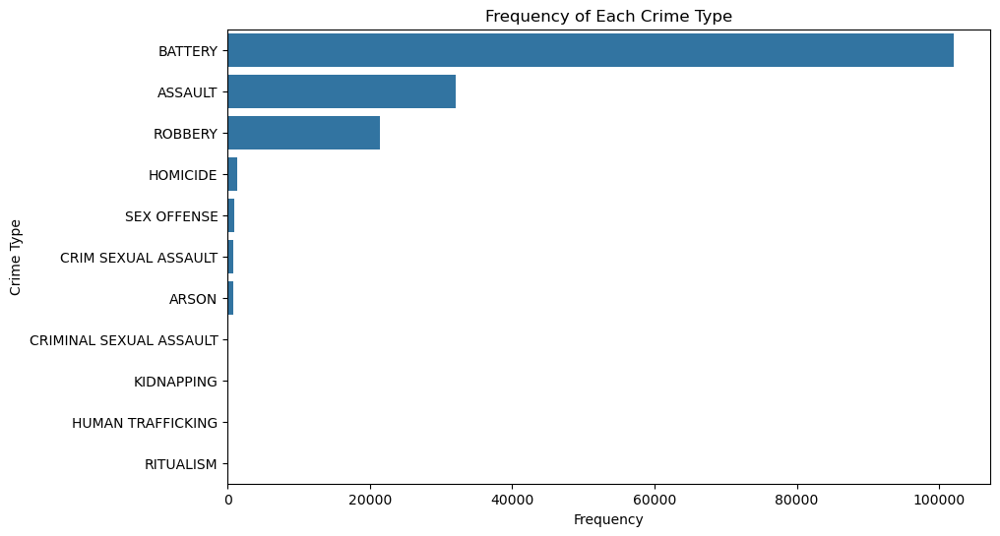

In [ ]:
# Graph the frequency of each crime type
plt.figure(figsize=(10, 6))
sns.countplot(
    y="Primary Type",
    data=full_crime,
    order=full_crime["Primary Type"].value_counts().index,
)
plt.title("Frequency of Each Crime Type")
plt.xlabel("Frequency")
plt.ylabel("Crime Type")
plt.show()

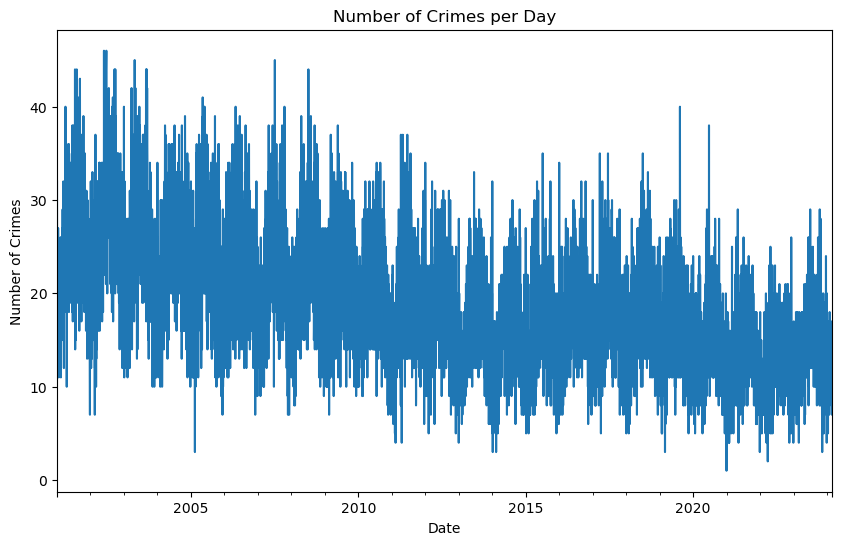

In [ ]:
# Make a time series plot of the number of crimes per day
full_crime["Date"] = pd.to_datetime(full_crime["Date"])
full_crime.set_index("Date", inplace=True)
plt.figure(figsize=(10, 6))
full_crime.resample("D").size().plot()
plt.title("Number of Crimes per Day")
plt.xlabel("Date")
plt.ylabel("Number of Crimes")
plt.show()

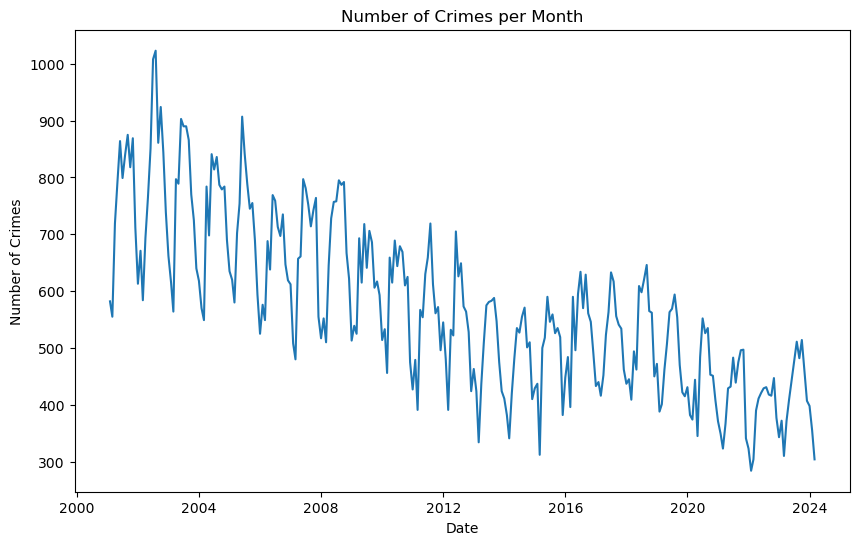

In [ ]:
# Condense the crime data such that we count number of crimes per month
monthly_crime = full_crime.resample("M").size().reset_index()
monthly_crime.columns = ["Date", "Number of Crimes"]
plt.figure(figsize=(10, 6))
plt.plot(monthly_crime["Date"], monthly_crime["Number of Crimes"])
plt.title("Number of Crimes per Month")
plt.xlabel("Date")
plt.ylabel("Number of Crimes")
plt.show()

C:\Users\hermi\AppData\Local\Temp\ipykernel_15132\570684482.py:4: FutureWarning:

Indexing a DataFrame with a datetimelike index using a single string to slice the rows, like `frame[string]`, is deprecated and will be removed in a future version. Use `frame.loc[string]` instead.



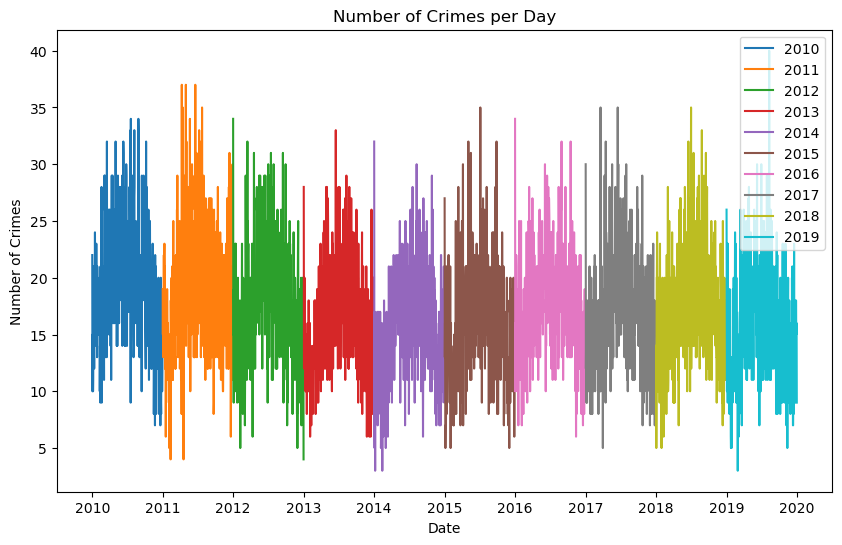

In [ ]:
# Make a plot for each year, showing number of crimes per day
plt.figure(figsize=(10, 6))
for year in range(2010, 2020):
    plt.plot(full_crime[str(year)]["Primary Type"].resample("M").size(), label=year)
plt.title("Number of Crimes per Day")
plt.xlabel("Date")
plt.ylabel("Number of Crimes")
plt.legend()
plt.show()

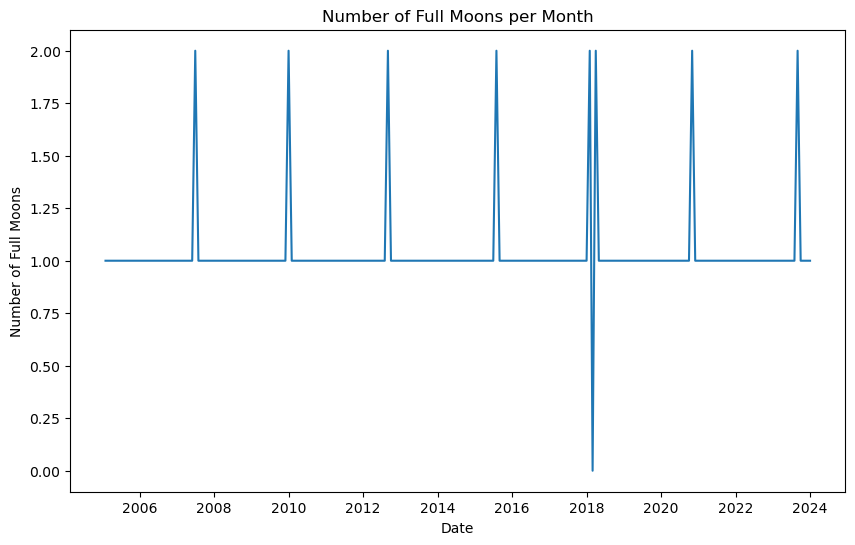

In [ ]:
# Set 'Date' column as the index
moon.set_index("FullMoonDates", inplace=True)

# Make a plot of how many full moons there are per month
full_moons = moon.resample("M").size().reset_index()
full_moons.columns = ["Date", "Number of Full Moons"]
plt.figure(figsize=(10, 6))
plt.plot(full_moons["Date"], full_moons["Number of Full Moons"])
plt.title("Number of Full Moons per Month")
plt.xlabel("Date")
plt.ylabel("Number of Full Moons")
plt.show()